In [2]:
# !pip install faiss-gpu==1.6.5
# !pip install tsnecuda==3.0.0 --no-deps
# !pip install mkl
# # need to install MKL: https://github.com/eddelbuettel/mkl4deb

In [25]:
gpt_specs = {
        "num_layers": 2,
        "num_heads": 8,
        "head_size": 32,
        "vocab_size": 50259,
        "hidden_size": 256,
        "max_position_embeddings": 512
}

import json
import days.w3d2.w3d2_tests as w3d2_tests
import transformers
import torch
from einops import rearrange, reduce, repeat

from sklearn.decomposition import PCA
from tsnecuda import TSNE
import matplotlib.pyplot as plt
import plotly.express as px
import pandas as pd

In [26]:
tokenizer = transformers.GPT2Tokenizer.from_pretrained("gpt2")
tokenizer._add_tokens(["[BEGIN]", "[END]"])
tokenizer.pad_token = "[END]"
tokenizer.eos_token = "[END]"
# 50258 is the pad_token_id
# 50257 is the BEGIN token id

with open("../w3d2/test_tokens_owt_subset.json") as f:
    test_tokens = torch.LongTensor(json.load(f))[:,:512]

sentences = ["So far, we've developed a theoretical model for understanding two-layer attention-only models.",
            "We have an overall equation describing the logits (the OV circuit), and then an equation describing how each attention head's attention pattern is computed (the QK circuit).",
             "But how do we understand them in practice?",
             "In this section, we'll reverse engineer a single two-layer model."]

In [27]:
# True -> use GPT
# False -> use 2-layer attention-only model
use_gpt = True

if use_gpt:
    model = transformers.GPT2Model.from_pretrained('gpt2')
    VOCAB_SIZE = 50257
    MAX_SEQ_LEN = 1024
    token_embed_fn = model.wte
    pos_embed_fn = model.wpe
else:
    model = w3d2_tests.get_minigpt("../w3d2/model.pt")
    VOCAB_SIZE = 50259
    MAX_SEQ_LEN = 512
    token_embed_fn = model.token_embedding
    pos_embed_fn = model.pos_embedding

In [28]:
with torch.no_grad():
    all_token_embeddings = token_embed_fn(torch.arange(VOCAB_SIZE))
all_token_embeddings.shape

torch.Size([50257, 768])

In [29]:
with torch.no_grad():
    all_position_embeddings = pos_embed_fn(torch.arange(MAX_SEQ_LEN))
all_position_embeddings.shape

torch.Size([1024, 768])

In [45]:
X = torch.concat([all_token_embeddings, all_position_embeddings], dim=0)

pca = PCA(n_components=2)
print(all_token_embeddings.shape)
projected = pca.fit_transform(X)
projected_transpose = rearrange(projected, "x y -> y x")

torch.Size([50257, 768])


In [46]:
tsne_input = X
tsne = TSNE()
tsne_result = tsne.fit_transform(tsne_input)
tsne_result_transpose = rearrange(tsne_result, "x y -> y x")

In [47]:
word_list = tokenizer.batch_decode(range(VOCAB_SIZE))

In [51]:
word_dict = {
    'name': word_list + [f"<pos{i}>" for i in range(MAX_SEQ_LEN)], 
    'pca component 1': projected_transpose[0], 
    'pca component 2': projected_transpose[1],
    'tsne axis 1': tsne_result_transpose[0],
    'tsne axis 2': tsne_result_transpose[1],
    'type': ["token" for i in range(VOCAB_SIZE)] + ["position" for i in range(MAX_SEQ_LEN)]
}

In [52]:
df = pd.DataFrame(data=word_dict)
df

,name,pca component 1,pca component 2,tsne axis 1,tsne axis 2,type
0,!,1.200104,0.384778,-42.472466,10.998689,token
1,"""",1.298837,0.512915,-42.568405,11.094437,token
2,#,0.741487,0.449651,-27.532490,2.207294,token
3,$,0.608090,0.437189,-21.066444,-4.420413,token
4,%,0.954208,0.521565,-27.322258,2.662007,token
...,...,...,...,...,...,...
51276,<pos1019>,1.724260,0.400463,-30.447344,-4.724811,position
51277,<pos1020>,1.733543,0.407353,-30.449814,-4.725532,position
51278,<pos1021>,1.728660,0.432955,-30.450245,-4.726719,position
51279,<pos1022>,1.720030,0.440093,-30.451571,-4.726163,position


In [53]:
x = "tsne axis 1"
y = "tsne axis 2"
fig = px.scatter(
    df, 
    x=x, 
    y=y, 
    hover_name="name",
    color="type",
    labels={
        x: "Axis 1",
        y: "Axis 2",
    },
    width=650, 
    height=650, 
)
fig.update_traces(
    # make the points smaller
    marker=dict(size=2),
    selector=dict(mode='markers'),
)
fig.show()

t-SNE is only good at preserving local distances, so clusters may be meaningful but distances between clusters are less meaningful.

* (-41, -35) Years in roughly increasing order. The tokens "WWII" and "wartime" are near the 1940s.
* (-42, -24) Numbers, roman numerals, and hex bytes
* (29, 21) Female names
* (11, 30) Chinese surnames
* (-15.23216, -6.850544) "Millenium" nearby "1000" nearby other numbers
* (6, -44) Sexual terms
* (-48.15, 21.28) Capitalized english letters
* (27.5, -40.85): months

In [52]:
fig.write_html("gpt2-tsne2.html")

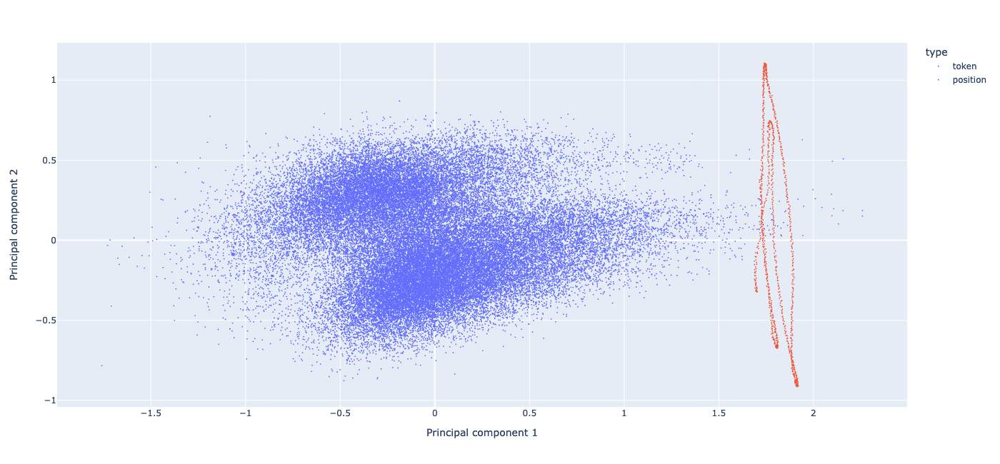

In [57]:
x = "pca component 1"
y = "pca component 2"
fig = px.scatter(
    df, 
    x=x, 
    y=y, 
    hover_name="name",
    color="type",
    labels={
        x: "Principal component 1",
        y: "Principal component 2",
    },
    width=650, 
    height=650, 
)
fig.update_traces(
    # make the points smaller
    marker=dict(size=2),
    selector=dict(mode='markers'),
)
fig.show()